In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib notebook
# plt.style.use('dark_background')
cmap = mpl.colormaps['viridis']

from convTesting import *
from convolution import *
from sampling import *

# Math/parallelization library includes
import numpy as np
import torch
from tqdm.notebook import tqdm

<IPython.core.display.Javascript object>


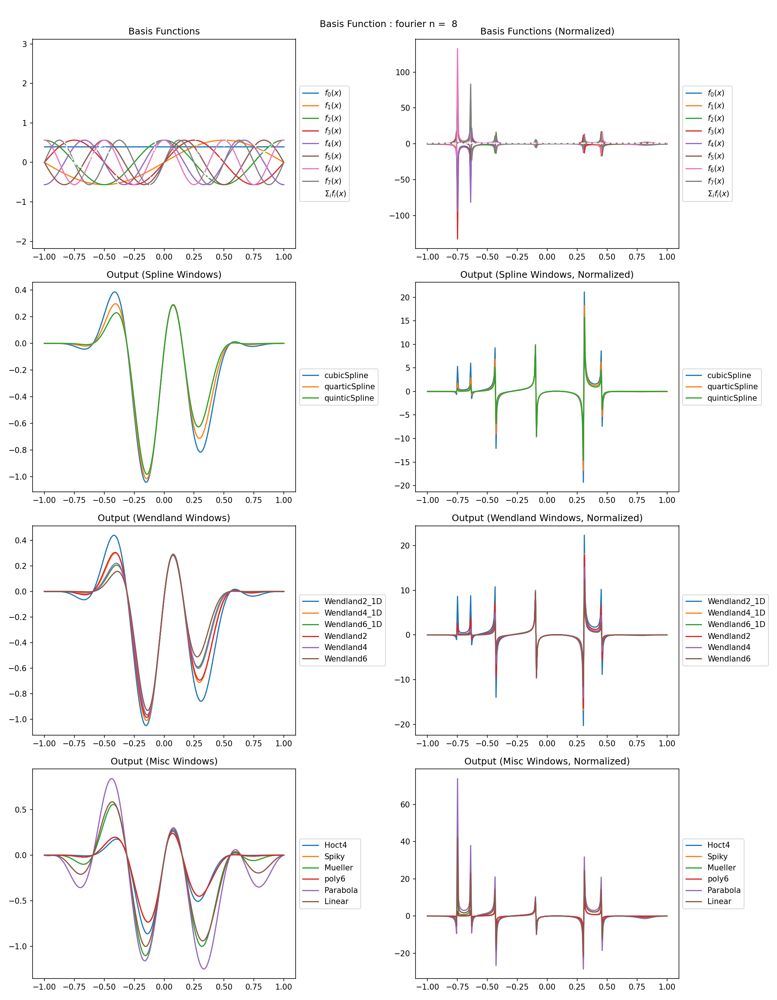

In [63]:
splines = ['cubicSpline', 'quarticSpline', 'quinticSpline']
wendlands = ['Wendland2_1D', 'Wendland4_1D', 'Wendland6_1D', 'Wendland2', 'Wendland4', 'Wendland6']
misc = ['Hoct4', 'Spiky', 'Mueller', 'poly6', 'Parabola', 'Linear']

fig, axis = plt.subplots(4, 2, figsize=(14,18), sharex = False, sharey = False, squeeze = False)

# basis = basisFunctions[2]
basis = 'fourier'
n = 8

def plotBasisFunction(axis, basis,n, points = 255):
    x =  torch.linspace(-1,1,points)
    fx = evalBasisFunction(n, x , which = basis, periodic=False)
#     print(fx.shape)
    for y in range(n):
        axis[0,0].plot(x, fx[y,:], label = '$f_%d(x)$' % y)
    axis[0,0].plot(x,torch.sum(fx, axis=0),ls='--',c='white', label = '$\Sigma_i f_i(x)$')
    # axis[0,0].legend()
    axis[0,0].legend(loc='center left', bbox_to_anchor=(1, 0.5),
              ncol=1, fancybox=True, shadow=False)
    axis[0,0].set_title('Basis Functions')

    baseLine = torch.sum(torch.linspace(-0.9,1,n)[:,None] * fx, axis=0)
    # axis[0,1].plot(x,baseLine,ls='--',c='white', label = 'Baseline')

    for w in splines:
        windowFn = getWindowFunction(w)
        axis[1,0].plot(x, windowFn(np.abs(x)) * baseLine, label = w)
    axis[1,0].legend(loc='center left', bbox_to_anchor=(1., 0.50), ncol=1, fancybox=True, shadow=False)
    axis[1,0].set_title('Output (Spline Windows)')
    for w in wendlands:
        windowFn = getWindowFunction(w)
        axis[2,0].plot(x, windowFn(np.abs(x)) * baseLine, label = w)
    axis[2,0].legend(loc='center left', bbox_to_anchor=(1., 0.50), ncol=1, fancybox=True, shadow=False)
    axis[2,0].set_title('Output (Wendland Windows)')
    for w in misc:
        windowFn = getWindowFunction(w)
        axis[3,0].plot(x, windowFn(np.abs(x)) * baseLine, label = w)
    axis[3,0].legend(loc='center left', bbox_to_anchor=(1., 0.50), ncol=1, fancybox=True, shadow=False)
    axis[3,0].set_title('Output (Misc Windows)')
    # axis[0,1].set_ylim(0,1.05)

    fx = evalBasisFunction(n, x , which = basis, periodic=False)
#     print(fx.shape)
    fx = fx / torch.sum(fx, axis = 0)[None,:]
    for y in range(n):
        axis[0,1].plot(x, fx[y,:], label = '$f_%d(x)$' % y)
    axis[0,1].plot(x,torch.sum(fx, axis=0),ls='--',c='white', label = '$\Sigma_i f_i(x)$')
    # axis[0,0].legend()
    axis[0,1].legend(loc='center left', bbox_to_anchor=(1, 0.5),
              ncol=1, fancybox=True, shadow=False)
    axis[0,1].set_title('Basis Functions (Normalized)')

    baseLine =torch.sum(torch.linspace(-1,1,n)[:,None] * fx, axis=0)
    # axis[1,1].plot(x,baseLine,ls='--',c='white', label = 'Baseline')

    for w in splines:
        windowFn = getWindowFunction(w)
        axis[1,1].plot(x, windowFn(np.abs(x)) * baseLine, label = w)
    axis[1,1].legend(loc='center left', bbox_to_anchor=(1., 0.50), ncol=1, fancybox=True, shadow=False)
    axis[1,1].set_title('Output (Spline Windows, Normalized)')
    for w in wendlands:
        windowFn = getWindowFunction(w)
        axis[2,1].plot(x, windowFn(np.abs(x)) * baseLine, label = w)
    axis[2,1].legend(loc='center left', bbox_to_anchor=(1., 0.50), ncol=1, fancybox=True, shadow=False)
    axis[2,1].set_title('Output (Wendland Windows, Normalized)')
    for w in misc:
        windowFn = getWindowFunction(w)
        axis[3,1].plot(x, windowFn(np.abs(x)) * baseLine, label = w)
    axis[3,1].legend(loc='center left', bbox_to_anchor=(1., 0.50), ncol=1, fancybox=True, shadow=False)
    axis[3,1].set_title('Output (Misc Windows, Normalized)')
    # axis[0,1].set_ylim(0,1.05)
    # axis[1,1].set_ylim(0,1.05)

    fig.suptitle('Basis Function : %s n = %2d' % (basis, n ))
    fig.canvas.draw()
    fig.canvas.flush_events()
    
plotBasisFunction(axis, basis, n, 256)
fig.tight_layout()
fig.canvas.draw()
fig.canvas.flush_events()

# imageFolder = 'basisFunctions'
# if not os.path.exists(imageFolder):
#     os.makedirs(imageFolder)
    
# for basis in tqdm(basisFunctions):
#     for xax in axis:
#         for ax in xax:
#             ax.cla()
#     plotBasisFunction(axis, basis, n, 256)
#     plt.savefig('%s/Basis Function : %s n = %2d.png' % (imageFolder, basis, n ), dpi = 200)


<IPython.core.display.Javascript object>


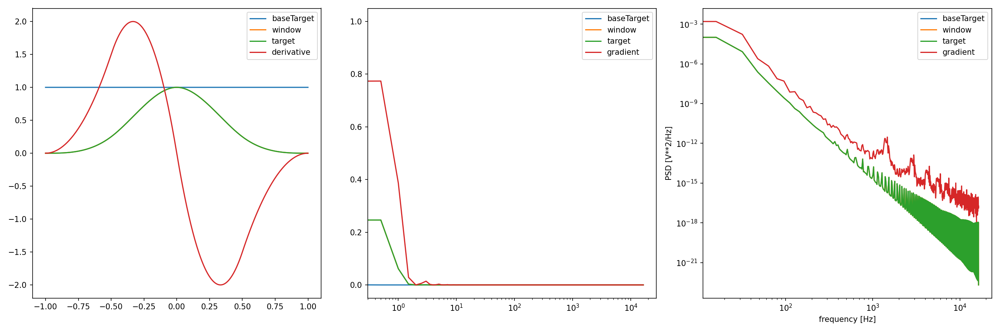

In [3]:
# target, targetGradient = generateTargetAndGradientFunction(baseOverride = lambda x: np.sin(x * np.pi), window = 'cubicSpline', plot = True, normalized = True)

target, _ = generateTargetAndGradientFunction(freq = 1, octaves = 8, seed = 1234, r = 1 / (2 * np.pi), persistence = 0.85, numSamples = 2**16, \
                                normalized = True, periodicNoise = True, window = 'cubicSpline', baseOverride = lambda x: np.ones(x.shape), plot = True)  

In [4]:
# def optimizeRegular(target, basis = 'linear', nBasis = 8, nSamples = 255, normalizedBasis = False, nSteps = 512):
#     x =  torch.linspace(-1,1,nSamples)
#     fx = evalBasis(nBasis, x, basis, periodic = False, normalized = normalizedBasis)
#     weights = torch.rand(nBasis) * 2 - 1
    
#     weights.requires_grad = True
#     optimizer = optim.SGD([weights], lr=1e-2, momentum=0.9)

#     weightList = []
#     gradList = []
#     weightList.append(torch.clone(weights.detach()))

#     for i in range(nSteps):
#         optimizer.zero_grad()

#         loss = torch.sum((torch.sum(weights[:,None] * fx, axis=0) - torch.tensor(target(x)))**2)
#         loss.backward()

#         gradList.append(torch.clone(weights.grad.detach()))
#         optimizer.step()
#         weightList.append(torch.clone(weights))
        
#     return weights, x, fx, weightList, gradList

In [5]:
# nBasis = 8
# nSamples = 255
# nSteps = 512
# basis = 'rbf cubic_spline'
# normalizedBasis = True

# weights, x, fx, weightList, gradList = optimizeRegular(target, basis = basis, nBasis = nBasis, nSamples = nSamples, normalizedBasis = normalizedBasis, nSteps = nSteps)

In [6]:
# fig, axis = plt.subplots(2, 2, figsize=(16,8), sharex = False, sharey = False, squeeze = False)
# x =  torch.linspace(-1,1,255)
# fx = evalBasis(n, x, basis, periodic = False, normalized = normalizedBasis)

# import matplotlib.colors as colors
# norm = colors.LogNorm(vmin=1, vmax=len(weightList))

# for i, w in enumerate(weightList):
#     c = cmap(-1 + 2 / (len(weightList) - 1)* i)
#     c = cmap(norm(i + 1) *2 -1)
#     for y in range(n):
#         fy = w[y].detach() * fx[y,:]
#         axis[1,0].plot(x[fy != 0], fy[fy != 0], label = '$w_d f_%d(x)$' % y, ls = '--', alpha = 0.5,c = c)
        
#     axis[0,0].plot(x,torch.sum(w[:,None].detach() * fx, axis=0),ls='-',c=c, label = 'epoch %d' % i)
#     loss = (torch.sum(w.detach()[:,None] * fx, axis=0) - target(x))**2
#     axis[0,1].plot(x, loss,c=c)
    
# gradListTensor = torch.vstack(gradList)
# for i in range(n):
#     axis[1,1].plot(gradListTensor[:,i])
    
# axis[1,1].plot(torch.sum(gradListTensor, axis=1), c = 'white', ls = '--')
# axis[0,0].plot(x, target(x),label = 'target',lw=2,c='red')
    
# axis[0,0].set_title('Learning Progress')
# axis[0,1].set_title('Loss')
# axis[1,0].set_title('Base Functions')
# axis[1,1].set_title('Gradients')
# axis[0,0].set_title('Interpolant')
# fig.tight_layout()

In [7]:
import scipy
import seaborn as sns

<IPython.core.display.Javascript object>


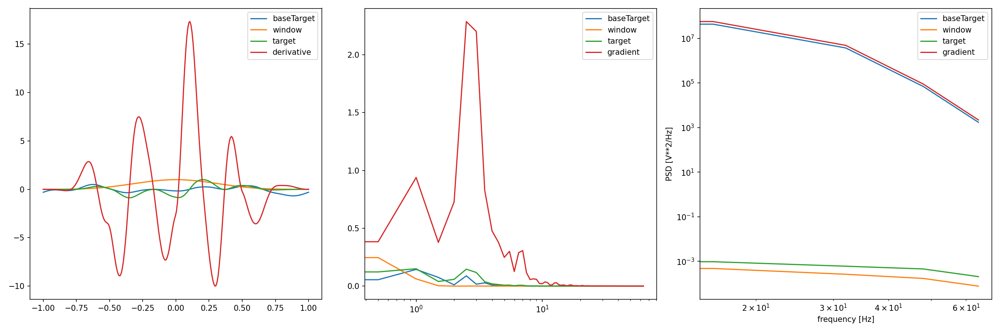

In [8]:
# target, _ = generateTargetAndGradientFunction(freq = 1, octaves = 8, seed = 1234, r = 1 / (2 * np.pi), persistence = 0.85, numSamples = 2**16, \
#                                 normalized = True, periodicNoise = True, window = 'cubicSpline', baseOverride = lambda x: np.ones(x.shape), plot = True)    
target, derivative = generateTargetAndGradientFunction(freq = 2, octaves = 4, seed = 1234, r = 1 / (2 * np.pi), persistence = 0.85, numSamples = 256, \
                                normalized = True, periodicNoise = True, window = 'cubicSpline', baseOverride = None, plot = True, kind = 'cubic')    

/home/winchenbach/dev/pytorchSPH2/Cconv/convolutionTesting/sampling.py:551: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  windowFn = lambda x : windowFunc(torch.abs(torch.tensor(x))).numpy()


<IPython.core.display.Javascript object>


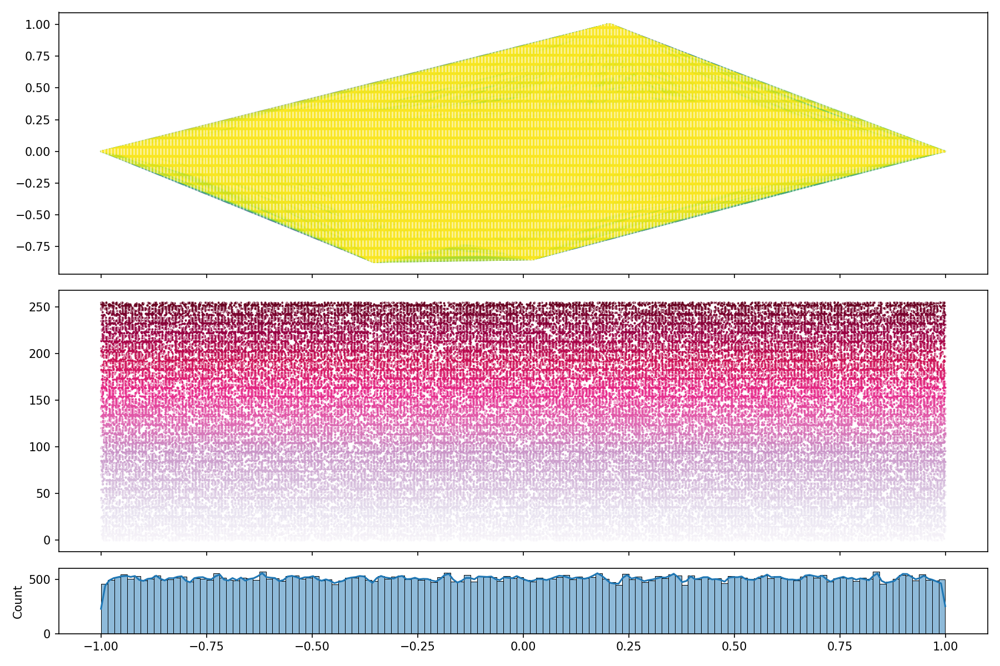

  0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/256 [00:00<?, ?it/s]

In [9]:
n = 8
basis = 'rbf cubic_spline 2'
# basis = 'rbf cubic_spline'
normalizedBasis = False
samples = 256
batch_size = 4
method= 'uniform'
dx = 2 / ( n - 1)
dxScale = 8
seed = 0x124567
nPerSample = 256
xNoise = False
yNoise = False


dataset = torch.vstack(sample(nPerSample, samples, method = method, dxScale = dxScale, dx = dx, clamped = True, seed = seed))
groundTruth = evalGroundTruth(samples, dataset, target, noise = yNoise, noiseType = 'uniform', noiseVar = 0.25)
plotDatasetAndGroundtruthv2(dataset, samples, target, groundTruth)

In [10]:
import warnings
warnings.filterwarnings("ignore")

In [11]:
dataset.shape

torch.Size([256, 256])

  0%|          | 0/4096 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


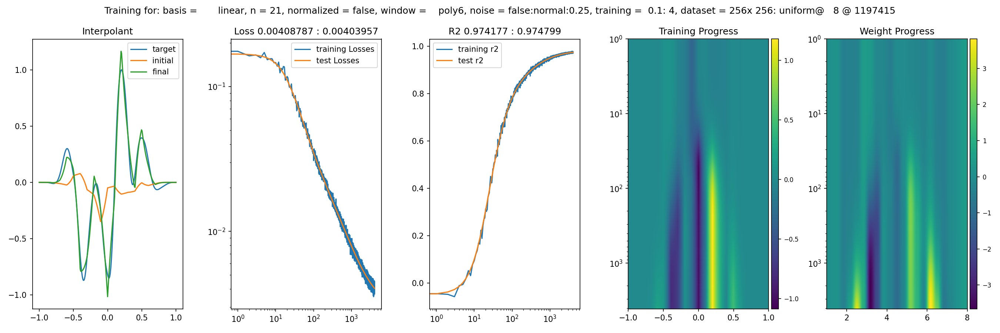

In [66]:
lr = 1e-1
batch_size = 4
window = 'poly6'
iterations = 2**12
groundTruthNoise = False
groundTruthNoiseType = 'normal'
groundTruthNoiseVariance = 0.25

n = 21
basis = 'linear'
normalizedBasis = False

weightList, lossList, r2List, gradList, yTest, testEvals, testr2s, testLosses = trainNetwork(dataset, target, lr = lr, batch_size = batch_size, n = n, basis = basis, normalizedBasis = normalizedBasis, window = window, iterations = iterations)

fig, axis = plotTraining(yTest, testEvals, lossList, testLosses, r2List, testr2s, weightList)
fig.suptitle('Training for: basis = %12s, n = %2d, normalized = %5s, window = %8s, noise = %5s:%6s:%4g, training = %4g:%2d, dataset = %2dx%4d:%8s@%4g @ %d'% (basis, n, 'true' if normalizedBasis else 'false', window, 'true' if groundTruthNoise else 'false', groundTruthNoiseType, groundTruthNoiseVariance, lr, batch_size, nPerSample, samples, method, dxScale if method != 'normal' else dx, seed))
fig.tight_layout()

In [67]:
states = []
iterations = 2**12

for n in tqdm(range(1,32)):
    state = trainNetwork(dataset, target, lr = lr, batch_size = batch_size, n = n, basis = basis, normalizedBasis = normalizedBasis, window = window, iterations = iterations)
    states.append(state)

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


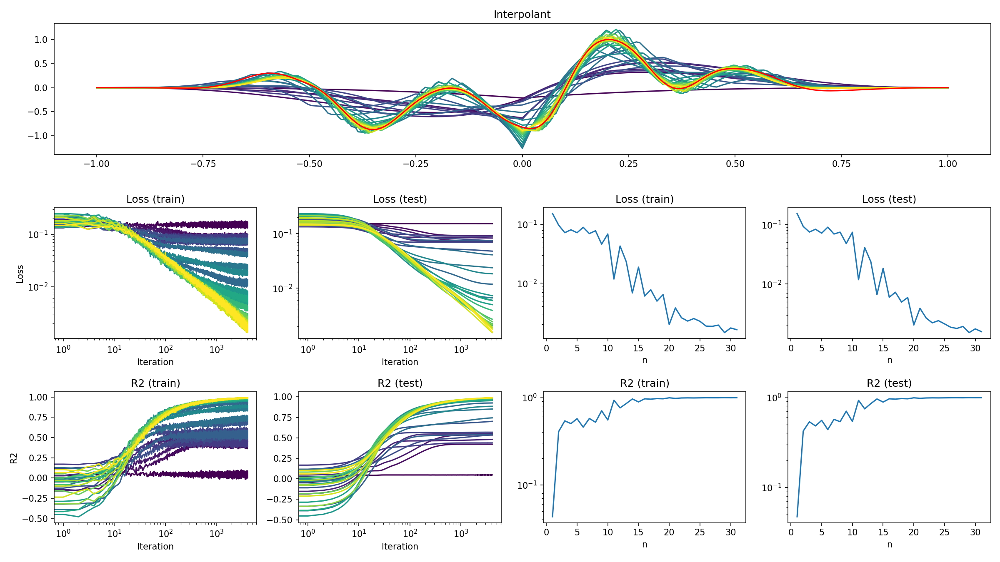

In [68]:
fig, axis = plt.subplot_mosaic('''
AAAA
BDCE
FHGI''', figsize=(16,9))

weightList, lossList, r2List, gradList, yTest, testEvals, testr2s, testLosses = states[0]
axis['A'].set_title('Interpolant')
axis['B'].set_title('Loss (train)')
axis['D'].set_title('Loss (test)')
axis['F'].set_title('R2 (train)')
axis['H'].set_title('R2 (test)')
axis['C'].set_title('Loss (train)')
axis['E'].set_title('Loss (test)')
axis['G'].set_title('R2 (train)')
axis['I'].set_title('R2 (test)')

axis['B'].set_ylabel('Loss')
axis['B'].set_xlabel('Iteration')
axis['C'].set_xlabel('n')
axis['D'].set_xlabel('Iteration')
axis['E'].set_xlabel('n')
axis['F'].set_ylabel('R2')
axis['F'].set_xlabel('Iteration')
axis['G'].set_xlabel('n')
axis['H'].set_xlabel('Iteration')
axis['I'].set_xlabel('n')

lossTrain = []
lossTest = []
r2Train = []
r2Test = []
for s, state in enumerate(states):
    weightList, lossList, r2List, gradList, yTest, testEvals, testr2s, testLosses = state
    color=mpl.colormaps['viridis'](1 / (len(states) - 1) * s)
    
    axis['A'].plot(np.linspace(-1,1,yTest.shape[0]), testEvals[-1], label = 'final', color = color)

    axis['B'].loglog(lossList, label = 'training Losses', color = color)
    axis['D'].loglog(testLosses, label = 'test Losses', color = color)
    # axis[0,1].legend()

    axis['F'].semilogx(r2List, label = 'training r2', color = color)
    axis['H'].semilogx(testr2s, label = 'test r2', color = color)
    
    lossTrain.append(lossList[-1])
    lossTest.append(testLosses[-1])
    r2Train.append(r2List[-1])
    r2Test.append(testr2s[-1])
    
axis['A'].plot(np.linspace(-1,1,yTest.shape[0]), yTest, label = 'target', c = 'red')

axis['C'].semilogy(np.arange(1, len(states) + 1), lossTrain)
axis['E'].semilogy(np.arange(1, len(states) + 1), lossTest)
axis['G'].semilogy(np.arange(1, len(states) + 1), r2Train)
axis['I'].semilogy(np.arange(1, len(states) + 1), r2Test)

fig.tight_layout()

In [15]:
import torch.nn as nn

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
def buildMLP(width = 1, depth = 0):
    model = nn.Sequential()
    model.add_module('inDense', nn.Linear(1,width))
    model.add_module('inNorm', nn.BatchNorm1d(num_features=width))
    model.add_module('inAct', nn.ReLU())
    for i in range(depth - 1):
        model.add_module('dense %d' % i , nn.Linear(width,width))
        model.add_module('norm %d' % i , nn.BatchNorm1d(num_features=width))
        model.add_module('act %d' % i, nn.ReLU())
    model.add_module('out', nn.Linear(width,1))
    return model

In [16]:
width = 16
depth = 16
model = buildMLP(width,depth)
parameters = count_parameters(model)

print(parameters)

4641


In [39]:
def trainMLP(model, dataset, target, lr=1e-1, batch_size = 4, iterations = 2**12, groundTruthNoise = False, groundTruthNoiseType = 'normal', groundTruthNoiseVariance = 0.25, testSamples = 255,device = 'cpu'):
    groundTruth = evalGroundTruth(dataset.shape[0], dataset, target, noise = groundTruthNoise, noiseType = groundTruthNoiseType, noiseVar = groundTruthNoiseVariance).to(device).type(torch.float32)

    train_dataloader, train_iter = generateLoaders(torch.hstack((dataset.to(device).type(torch.float32),groundTruth)), batch_size = 4, shuffleDataset = True, shuffled = False, shuffleSeed = None)
    def sampleDataLoader():
        try:
            bdata = next(train_iter)
        except:
            train_iter = iter(train_dataloader)
            bdata = next(train_iter)
        return bdata

    model.apply(init_weights)
    optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9)

    weightList = []
    gradList = []
    lossList = []
    r2List = []
    weightList.append(copy.deepcopy(model.state_dict()))

    xTest = torch.linspace(-1,1,testSamples)
    yTest = target(xTest)
    xTest = xTest.to(device).type(torch.float32)

    test_losses = []
    test_evals = []
    test_r2s = []

    for i in (t := tqdm(range(iterations), leave = False)):
        testEval = model(xTest[:,None]).flatten().detach()


        test_losses.append(np.mean((testEval.cpu().numpy() - yTest)**2))
        test_r2s.append(r2_score(yTest, testEval.cpu().numpy()))
        if i == iterations - 1:
            test_evals.append(testEval)

        optimizer.zero_grad()

        sampled = sampleDataLoader()
        x = sampled[:,:sampled.shape[1]//2].flatten()[:,None].type(torch.float32)
        gt = sampled[:,sampled.shape[1]//2:].flatten()


        y_pred = model(x).flatten()
        loss = torch.mean((y_pred - gt)**2)

#         if i == iterations - 1:
        r2List.append(r2_score(gt.detach().cpu().numpy(), y_pred.detach().cpu().numpy()))

        loss.backward()
        lossList.append(torch.clone(loss.detach()))

    #     gradList.append(torch.clone(weights.grad.detach()))
        optimizer.step()
    #     weightList.append(torch.clone(weights))

        if i == iterations - 1:
            weightList.append(copy.deepcopy(model.state_dict()))

            weightsCurrent = torch.hstack([weightList[-1][w].flatten() for w in weightList[-1]])
            weightsPrior = torch.hstack([weightList[-2][w].flatten() for w in weightList[-2]])

#         t.set_description('Iteration %5d, Loss: %6.4e / %6.4e, R2: %6.4e / %6.4e, Update: %6.4e' %(i, 
#                             lossList[-1], test_losses[-1].detach().cpu().numpy(), 
#                             r2List[-1], test_r2s[-1], torch.linalg.norm(weightsCurrent - weightsPrior)))

    return weightList, lossList, r2List, gradList, yTest, test_evals, test_r2s, test_losses

  0%|          | 0/4096 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


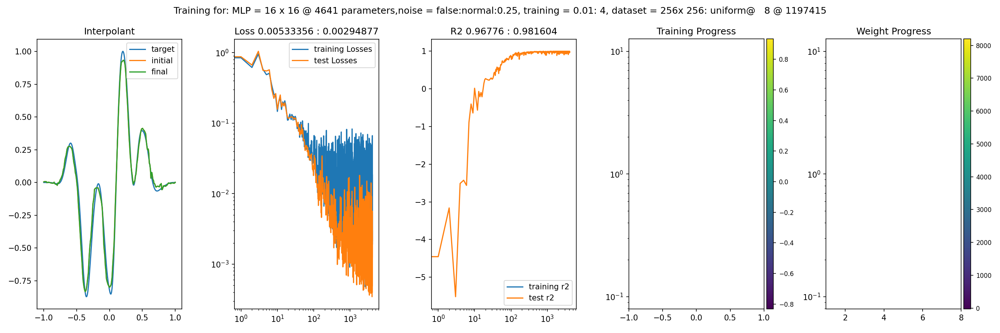

In [38]:
lr = 1e-2
batch_size = 4
window = 'poly6'
iterations = 2**12
groundTruthNoise = False
groundTruthNoiseType = 'normal'
groundTruthNoiseVariance = 0.25

# n = 32
# basis = 'linear'
# normalizedBasis = False

width = 16
depth = 16

model = buildMLP(width,depth)
parameters = count_parameters(model)

# print(parameters)


weightList, lossList, r2List, gradList, yTest, testEvals, testr2s, testLosses = trainMLP(model, dataset, target, lr = lr, batch_size = batch_size, iterations = iterations,device = device)

fig, axis = plotTrainingMLP(yTest, testEvals, lossList, testLosses, r2List, testr2s, weightList)
fig.suptitle('Training for: MLP = %2d x %2d @ %4d parameters,noise = %5s:%6s:%4g, training = %4g:%2d, dataset = %2dx%4d:%8s@%4g @ %d'% (width, depth, parameters, 'true' if groundTruthNoise else 'false', groundTruthNoiseType, groundTruthNoiseVariance, lr, batch_size, nPerSample, samples, method, dxScale if method != 'normal' else dx, seed))
fig.tight_layout()


In [40]:
MLPStates = []
iterations = 2**13
nw = 17
nd = 17

for w in tqdm(range(1,nw),leave = False):
    MLPStatesd = []
    for d in tqdm(range(1,nd),leave = False):
        model = buildMLP(w,d)
        state = trainMLP(model, dataset, target, lr = lr, batch_size = batch_size, iterations = iterations)
        MLPStatesd.append(state)
    MLPStates.append(MLPStatesd)

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/8192 [00:00<?, ?it/s]

In [1]:
print(nw)

NameError: name 'nw' is not defined

<IPython.core.display.Javascript object>


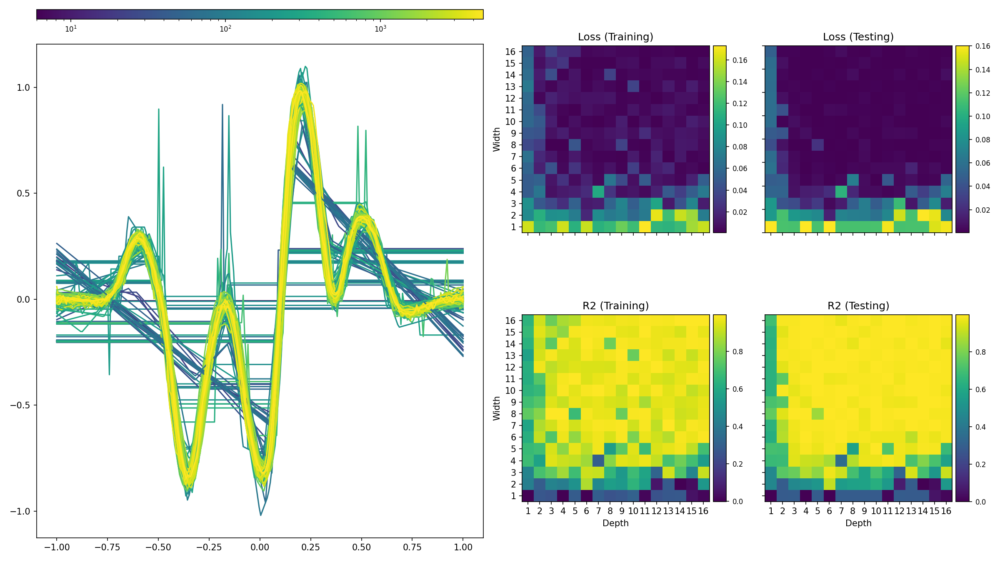

In [49]:


lossMatTrain = np.zeros((nw - 1, nd - 1))
lossMatTest = np.zeros((nw - 1,nd - 1))
r2MatTrain = np.zeros((nw - 1,nd - 1))
r2MatTest = np.zeros((nw - 1,nd - 1))
fig, axis = plt.subplot_mosaic('''
AABC
AADE''', figsize=(16,9))

params = np.zeros((nw - 1,nd - 1))

for w in (range(nw - 1)):
    for d in (range(nd - 1)):
        weightList, lossList, r2List, gradList, yTest, testEvals, testr2s, testLosses = MLPStates[w][d]
        
        lossMatTrain[w,d] = lossList[-1]
        lossMatTest[w,d] = testLosses[-1]
        r2MatTrain[w,d] = r2List[-1]
        r2MatTest[w,d] = testr2s[-1]
#         r2MatTrain[w,d] = w
#         r2MatTest[w,d] = d
        model = buildMLP(w + 1,d + 1)
        model.load_state_dict(MLPStates[w][d][0][-1])
        params[w,d] = count_parameters(model)
        
norm = mpl.colors.Normalize(vmin=np.min(params), vmax=np.max(params))    
norm = mpl.colors.LogNorm(vmin = np.min(params), vmax = np.max(params))
for w in (range(nw-1)):
    for d in (range(nd-1)):    
        xs = torch.linspace(-1, 1, 256)[:,None]
        model = buildMLP(w + 1,d + 1)
        model.load_state_dict(MLPStates[w][d][0][-1])
        
        ys = model(xs).flatten()
        parameters = count_parameters(model)
        
        
        color = mpl.colormaps['viridis']((parameters - np.min(params)) / (np.max(params) - np.min(params)))
        color = mpl.colormaps['viridis'](norm(parameters))
        axis['A'].plot(xs.flatten(),ys.detach().cpu().numpy(), c = color)
        

        

axis['B'].set_title('Loss (Training)')
im = axis['B'].imshow(lossMatTrain[::-1,:], extent = [0,nw - 1,0,nd - 1])
ax1_divider = make_axes_locatable(axis['B'])
cax1 = ax1_divider.append_axes("right", size="7%", pad="2%")
cb1 = fig.colorbar(im, cax=cax1,orientation='vertical')
cb1.ax.tick_params(labelsize=8) 

axis['C'].set_title('Loss (Testing)')
im = axis['C'].imshow(lossMatTest[::-1,:], extent = [0,nw - 1,0,nd - 1])
ax1_divider = make_axes_locatable(axis['C'])
cax1 = ax1_divider.append_axes("right", size="7%", pad="2%")
cb1 = fig.colorbar(im, cax=cax1,orientation='vertical')
cb1.ax.tick_params(labelsize=8) 

axis['D'].set_title('R2 (Training)')
im = axis['D'].imshow(r2MatTrain[::-1,:], extent = [0,nw - 1,0,nd - 1])
ax1_divider = make_axes_locatable(axis['D'])
cax1 = ax1_divider.append_axes("right", size="7%", pad="2%")
cb1 = fig.colorbar(im, cax=cax1,orientation='vertical')
cb1.ax.tick_params(labelsize=8) 

axis['E'].set_title('R2 (Testing)')
im = axis['E'].imshow(r2MatTest[::-1,:], extent = [0,nw - 1,0,nd - 1])
ax1_divider = make_axes_locatable(axis['E'])
cax1 = ax1_divider.append_axes("right", size="7%", pad="2%")
cb1 = fig.colorbar(im, cax=cax1,orientation='vertical')
cb1.ax.tick_params(labelsize=8) 

ax1_divider = make_axes_locatable(axis['A'])
cax1 = ax1_divider.append_axes("top", size="2%", pad="5%")
cb1 = fig.colorbar(cm.ScalarMappable(norm=norm, cmap=mpl.colormaps['viridis']), cax=cax1,orientation='horizontal')
cb1.ax.tick_params(labelsize=8) 


axis['B'].set_ylabel('Width')
axis['B'].set_yticks(np.arange(nw - 1) + 0.5)
axis['B'].set_xticks(np.arange(nd - 1) + 0.5)
axis['B'].set_xticklabels([])
axis['C'].set_xticks(np.arange(nd - 1) + 0.5)
axis['C'].set_xticklabels([])
axis['C'].set_yticklabels([])
axis['B'].set_yticklabels(np.arange(nd - 1) + 1)
axis['D'].set_ylabel('Width')
axis['D'].set_yticks(np.arange(nw - 1) + 0.5)
axis['D'].set_yticklabels(np.arange(nd - 1) + 1)
axis['D'].set_xlabel('Depth')
axis['D'].set_xticks(np.arange(nd - 1) + 0.5)
axis['D'].set_xticklabels(np.arange(nd - 1) + 1)
axis['E'].set_xlabel('Depth')
axis['E'].set_yticks(np.arange(nw - 1) + 0.5)
axis['E'].set_xticks(np.arange(nd - 1) + 0.5)
axis['E'].set_xticklabels(np.arange(nd - 1) + 1)
axis['E'].set_yticklabels([ ])

fig.tight_layout()

<IPython.core.display.Javascript object>


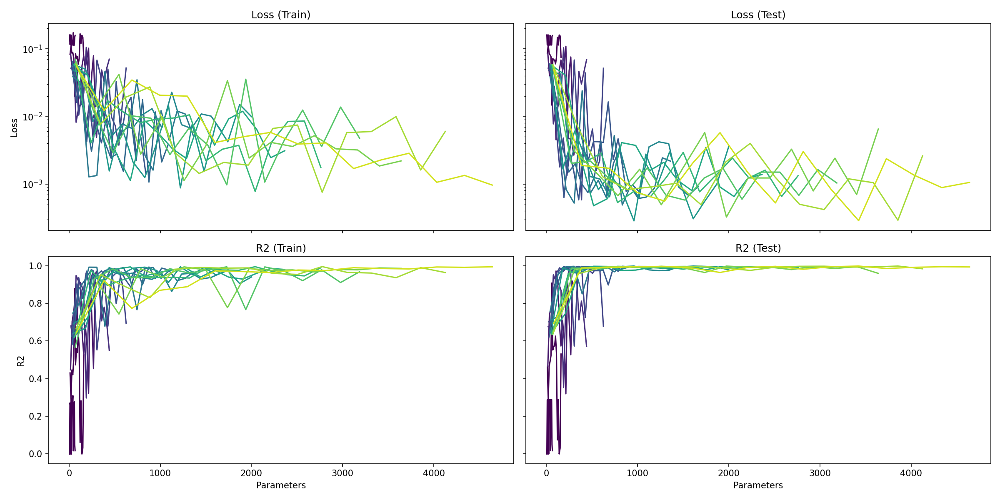

In [62]:
from scipy.interpolate import make_interp_spline, BSpline
from scipy.ndimage.filters import gaussian_filter1d

fig, axis = plt.subplots(2, 2, figsize=(16,8), sharex = True, sharey = 'row', squeeze = False)
norm = mpl.colors.Normalize(vmin=1, vmax=nw-1)    

for w in (range(nw-1)):
    x = params[w,:]
    y = lossMatTrain[w,:]
    spl = make_interp_spline(x, y, k=5)  # type: BSpline
    power_smooth = spl(x)
    power_smooth = gaussian_filter1d(y,sigma = 1)
    
    
    axis[0,0].semilogy(params[w,:], lossMatTrain[w,:], color = mpl.colormaps['viridis'](norm(w)))
    axis[0,1].semilogy(params[w,:], lossMatTest[w,:], color = mpl.colormaps['viridis'](norm(w)))
    axis[1,0].plot(params[w,:], r2MatTrain[w,:], color = mpl.colormaps['viridis'](norm(w)))
    axis[1,1].plot(params[w,:], r2MatTest[w,:], color = mpl.colormaps['viridis'](norm(w)))
    
#     axis[0,1].plot(params[w,:], power_smooth, color = mpl.colormaps['viridis'](norm(w)))
#     break
axis[0,0].set_title('Loss (Train)')
axis[0,1].set_title('Loss (Test)')
axis[1,0].set_title('R2 (Train)')
axis[1,1].set_title('R2 (Test)')

axis[0,0].set_ylabel('Loss')
axis[1,0].set_ylabel('R2')
axis[1,0].set_xlabel('Parameters')
axis[1,1].set_xlabel('Parameters')

fig.tight_layout()

<IPython.core.display.Javascript object>


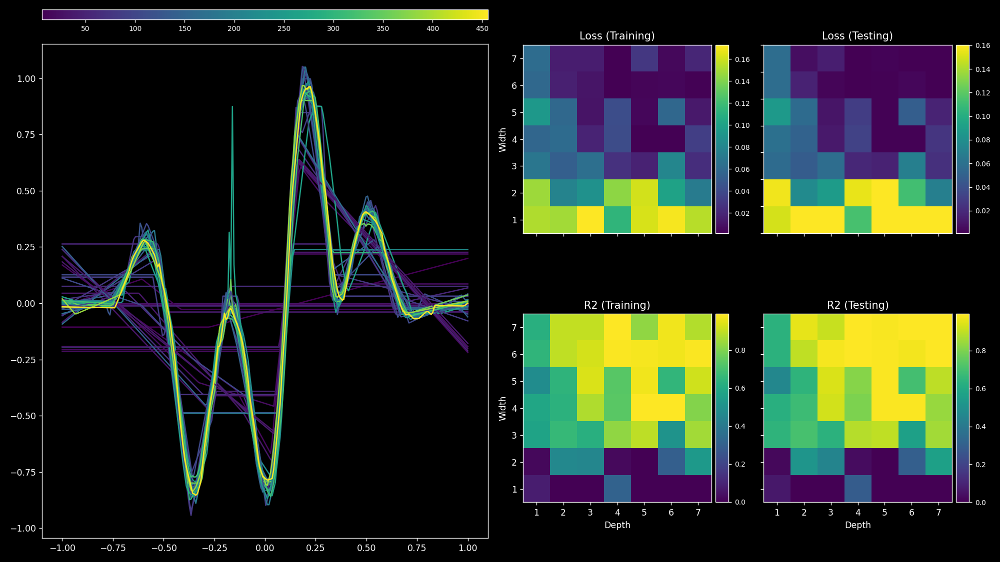

In [260]:
nw = 8
nd = 8

lossMatTrain = np.zeros((nw - 1, nd - 1))
lossMatTest = np.zeros((nw - 1,nd - 1))
r2MatTrain = np.zeros((nw - 1,nd - 1))
r2MatTest = np.zeros((nw - 1,nd - 1))
fig, axis = plt.subplot_mosaic('''
AABC
AADE''', figsize=(16,9))

params = np.zeros((nw - 1,nd - 1))

for w in (range(nw - 1)):
    for d in (range(nd - 1)):
        weightList, lossList, r2List, gradList, yTest, testEvals, testr2s, testLosses = MLPStates[w][d]
        
        lossMatTrain[w,d] = lossList[-1]
        lossMatTest[w,d] = testLosses[-1]
        r2MatTrain[w,d] = r2List[-1]
        r2MatTest[w,d] = testr2s[-1]
#         r2MatTrain[w,d] = w
#         r2MatTest[w,d] = d
        model = buildMLP(w + 1,d + 1)
        model.load_state_dict(MLPStates[w][d][0][-1])
        params[w,d] = count_parameters(model)
        
        
    
for w in (range(7)):
    for d in (range(7)):    
        xs = torch.linspace(-1, 1, 256)[:,None]
        model = buildMLP(w + 1,d + 1)
        model.load_state_dict(MLPStates[w][d][0][-1])
        
        ys = model(xs).flatten()
        parameters = count_parameters(model)
        color = mpl.colormaps['viridis']((parameters - np.min(params)) / (np.max(params) - np.min(params)))
        axis['A'].plot(xs.flatten(),ys.detach().cpu().numpy(), c = color)
        

        

axis['B'].set_title('Loss (Training)')
im = axis['B'].imshow(lossMatTrain[::-1,:], extent = [0,nw - 1,0,nd - 1])
ax1_divider = make_axes_locatable(axis['B'])
cax1 = ax1_divider.append_axes("right", size="7%", pad="2%")
cb1 = fig.colorbar(im, cax=cax1,orientation='vertical')
cb1.ax.tick_params(labelsize=8) 

axis['C'].set_title('Loss (Testing)')
im = axis['C'].imshow(lossMatTest[::-1,:], extent = [0,nw - 1,0,nd - 1])
ax1_divider = make_axes_locatable(axis['C'])
cax1 = ax1_divider.append_axes("right", size="7%", pad="2%")
cb1 = fig.colorbar(im, cax=cax1,orientation='vertical')
cb1.ax.tick_params(labelsize=8) 

axis['D'].set_title('R2 (Training)')
im = axis['D'].imshow(r2MatTrain[::-1,:], extent = [0,nw - 1,0,nd - 1])
ax1_divider = make_axes_locatable(axis['D'])
cax1 = ax1_divider.append_axes("right", size="7%", pad="2%")
cb1 = fig.colorbar(im, cax=cax1,orientation='vertical')
cb1.ax.tick_params(labelsize=8) 

axis['E'].set_title('R2 (Testing)')
im = axis['E'].imshow(r2MatTest[::-1,:], extent = [0,nw - 1,0,nd - 1])
ax1_divider = make_axes_locatable(axis['E'])
cax1 = ax1_divider.append_axes("right", size="7%", pad="2%")
cb1 = fig.colorbar(im, cax=cax1,orientation='vertical')
cb1.ax.tick_params(labelsize=8) 

ax1_divider = make_axes_locatable(axis['A'])
cax1 = ax1_divider.append_axes("top", size="2%", pad="5%")
cb1 = fig.colorbar(cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=np.min(params), vmax=np.max(params)), cmap=mpl.colormaps['viridis']), cax=cax1,orientation='horizontal')
cb1.ax.tick_params(labelsize=8) 


axis['B'].set_ylabel('Width')
axis['B'].set_yticks(np.arange(nw - 1) + 0.5)
axis['B'].set_xticks(np.arange(nd - 1) + 0.5)
axis['B'].set_xticklabels([])
axis['C'].set_xticks(np.arange(nd - 1) + 0.5)
axis['C'].set_xticklabels([])
axis['C'].set_yticklabels([])
axis['B'].set_yticklabels(np.arange(nd - 1) + 1)
axis['D'].set_ylabel('Width')
axis['D'].set_yticks(np.arange(nw - 1) + 0.5)
axis['D'].set_yticklabels(np.arange(nd - 1) + 1)
axis['D'].set_xlabel('Depth')
axis['D'].set_xticks(np.arange(nd - 1) + 0.5)
axis['D'].set_xticklabels(np.arange(nd - 1) + 1)
axis['E'].set_xlabel('Depth')
axis['E'].set_yticks(np.arange(nw - 1) + 0.5)
axis['E'].set_xticks(np.arange(nd - 1) + 0.5)
axis['E'].set_xticklabels(np.arange(nd - 1) + 1)
axis['E'].set_yticklabels([ ])

fig.tight_layout()

In [233]:
model = buildMLP(w + 1,d + 1)
model.load_state_dict(MLPStates[w][d][0][-1])
xs = torch.linspace(-1, 1, 256)[:,None]
ys = model(xs).flatten()
axis['A'].plot(xs.flatten(),ys.detach().cpu().numpy())

axis['A'].plot(np.linspace(-1,1,yTest.shape[0]), yTest, label = 'target', c = 'red')

In [240]:

xTest = torch.linspace(-1,1,testSamples)[:,None]
yTest = torch.tensor(target(xTest)).flatten()

yPred = model(xTest).flatten()

# print(yTest, yPred)
print(yTest - yPred)

tensor([ 2.7853e-02,  2.6593e-02,  2.5325e-02,  2.4049e-02,  2.2764e-02,
         2.1472e-02,  2.0176e-02,  1.8879e-02,  1.7579e-02,  1.6275e-02,
         1.4959e-02,  1.3619e-02,  1.2242e-02,  1.0808e-02,  9.2981e-03,
         7.6926e-03,  5.9725e-03,  5.3474e-03,  9.6342e-03,  1.3796e-02,
         1.7847e-02,  2.1819e-02,  2.5761e-02,  2.2530e-02,  1.8151e-02,
         1.3983e-02,  1.0124e-02,  6.6933e-03,  3.8201e-03,  1.6731e-03,
         8.8990e-03,  9.1849e-06, -6.2458e-03, -9.6028e-03, -1.1324e-02,
        -1.1216e-02, -9.2573e-03, -5.3790e-03,  3.8961e-04,  8.0182e-03,
        -2.6840e-03, -1.8265e-02, -2.1415e-02, -3.9295e-02, -5.7515e-02,
        -3.4853e-02, -2.8712e-02, -2.9759e-02, -2.9693e-02, -5.7197e-03,
         1.4549e-02,  3.1413e-02,  4.4729e-02,  4.8024e-02,  4.1495e-02,
         3.2444e-02,  1.9302e-02,  4.8818e-03,  2.2614e-02,  4.5378e-02,
         3.4484e-02,  6.4642e-02,  1.1077e-01,  8.7439e-02,  8.4223e-02,
         7.5710e-02,  9.4576e-02,  1.1107e-01,  1.2

In [16]:
splines = ['cubicSpline', 'quarticSpline', 'quinticSpline']
wendlands = ['Wendland2_1D', 'Wendland4_1D', 'Wendland6_1D', 'Wendland2', 'Wendland4', 'Wendland6']
misc = ['Hoct4', 'Spiky', 'Mueller', 'poly6', 'Parabola', 'Linear']

basisFunctions = ['linear', 'chebyshev', 'chebyshev2', 'fourier', 'rbf gaussian', 'rbf multiquadric', 'rbf inverse_quadric', 'rbf polyharmonic', 'rbf bump', 'rbf cubic_spline', 'rbf quartic_spline', 'rbf quintic_spline', 'rbf wendland2', 'rbf wendland4', 'rbf poly6', 'rbf spiky', 'rbf square']
basisFunctions =  basisFunctions + ['rbf gaussian 2', 'rbf multiquadric 2', 'rbf inverse_quadric 2', 'rbf polyharmonic 2', 'rbf bump 2', 'rbf cubic_spline 2', 'rbf quartic_spline 2', 'rbf quintic_spline 2', 'rbf wendland2 2', 'rbf wendland4 2', 'rbf poly6 2', 'rbf spiky 2', 'rbf square 2']
basisFunctions = basisFunctions + ['rbf gaussian 0.5', 'rbf multiquadric 0.5', 'rbf inverse_quadric 0.5', 'rbf polyharmonic 0.5', 'rbf bump 0.5', 'rbf cubic_spline 0.5', 'rbf quartic_spline 0.5', 'rbf quintic_spline 0.5', 'rbf wendland2 0.5', 'rbf wendland4 0.5', 'rbf poly6 0.5', 'rbf spiky 0.5', 'rbf square 0.5']
windowFunction = ['cubicSpline', 'quarticSpline', 'quinticSpline', 'Wendland2_1D', 'Wendland4_1D', 'Wendland6_1D', 'Wendland2', 'Wendland4', 'Wendland6', 'Hoct4', 'Spiky', 'Mueller', 'poly6', 'Parabola', 'Linear']

In [17]:
import os

In [18]:
weightDict = {}
lossDict = {}
r2Dict = {}
funDict = {}
normalizedBasis = False
for w in windowFunction:
    weightDict[w] = {}
    lossDict[w] = {}
    r2Dict[w] = {}
    funDict[w] = {}

for w in tqdm(windowFunction):
    for b in (t := tqdm(basisFunctions, leave = False)):
        t.set_description('%10s x %s' % (w, b))
        try:
            weightList, lossList, r2List, gradList, yTest, testEvals, testr2s, testLosses = trainNetwork(dataset, target, lr = lr, batch_size = batch_size, n = n, basis = b, normalizedBasis = normalizedBasis, window = w, iterations = iterations)
            weightDict[w][b] = weightList
            lossDict[w][b] = (lossList, testLosses)
            r2Dict[w][b] = (r2List, testr2s)
            funDict[w][b] = yTest
        except ValueError:
            print("%10s x %s Didn't work" %(w,b))
#         print(w,b)
#         break
#     break

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

  0%|          | 0/4096 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [43]:
print(e)

NameError: name 'e' is not defined

In [121]:
lossMatA = np.ones((len(windowFunction), len(basisFunctions))) * np.nan
lossMatB = np.ones((len(windowFunction), len(basisFunctions))) * np.nan
r2MatA = np.ones((len(windowFunction), len(basisFunctions))) * np.nan
r2MatB = np.ones((len(windowFunction), len(basisFunctions))) * np.nan
for w in lossDict:
    print('window:', w)
#     break
    for b in lossDict[w]:
        print('basis:', b)
        lossMatA[windowFunction.index(w), basisFunctions.index(b)] = lossDict[w][b][0][-1]
        r2MatA[windowFunction.index(w), basisFunctions.index(b)] = r2Dict[w][b][0][-1]
        lossMatB[windowFunction.index(w), basisFunctions.index(b)] = lossDict[w][b][1][-1]
        r2MatB[windowFunction.index(w), basisFunctions.index(b)] = r2Dict[w][b][1][-1]
        
        

window: cubicSpline
basis: linear
basis: chebyshev
basis: chebyshev2
basis: fourier
basis: rbf gaussian
basis: rbf multiquadric
basis: rbf inverse_quadric
basis: rbf polyharmonic
basis: rbf bump
basis: rbf cubic_spline
basis: rbf quartic_spline
basis: rbf quintic_spline
basis: rbf wendland2
basis: rbf wendland4
basis: rbf poly6
basis: rbf spiky
basis: rbf square
basis: rbf gaussian 2
basis: rbf inverse_quadric 2
basis: rbf bump 2
basis: rbf cubic_spline 2
basis: rbf quartic_spline 2
basis: rbf quintic_spline 2
basis: rbf wendland2 2
basis: rbf wendland4 2
basis: rbf poly6 2
basis: rbf spiky 2
basis: rbf square 2
basis: rbf gaussian 0.5
basis: rbf multiquadric 0.5
basis: rbf inverse_quadric 0.5
basis: rbf bump 0.5
basis: rbf cubic_spline 0.5
basis: rbf quartic_spline 0.5
basis: rbf quintic_spline 0.5
basis: rbf wendland2 0.5
basis: rbf wendland4 0.5
basis: rbf poly6 0.5
basis: rbf spiky 0.5
basis: rbf square 0.5
window: quarticSpline
basis: linear
basis: chebyshev
basis: chebyshev2
basi

<IPython.core.display.Javascript object>


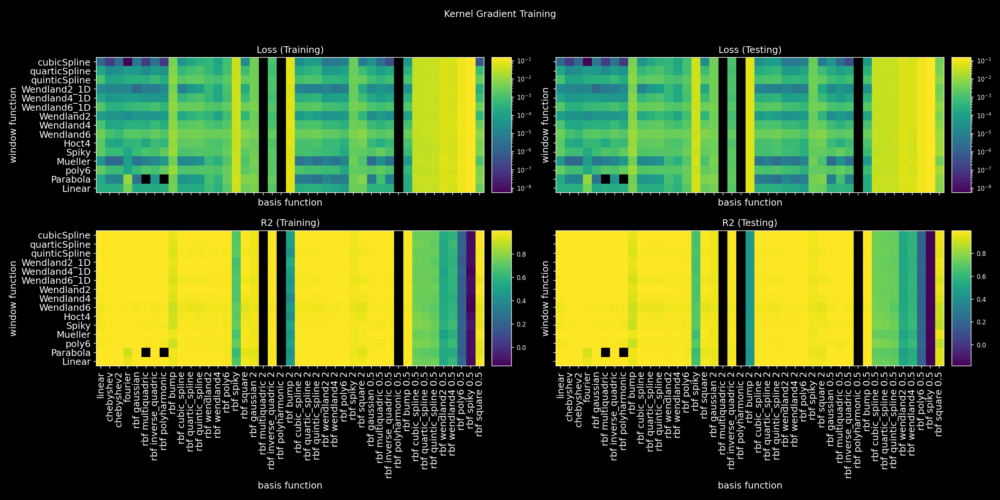

min: 5.482881970656415e-09
max: 0.15051367320367048
min: 5.5868575979714735e-09
max: 0.15289467301907164


In [126]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cbook as cbook
from matplotlib import cm

xvars = windowFunction
yvars = basisFunctions

import matplotlib.patheffects as path_effects
txtLabels = []
def plotToAxis(axis, mat, bounds = None, label = None, log = False):
    if label is not None:
        axis.set_title(label)
    if bounds is None:
        if not log:
            im = axis.imshow(mat, vmin=mat[np.logical_not(np.isnan(mat))].min(), vmax=mat[np.logical_not(np.isnan(mat))].max())
        if log:
            print('min:', mat[np.logical_and(np.logical_not(np.isinf(mat)),np.logical_not(np.isnan(mat)))].min())
            print('max:', mat[np.logical_and(np.logical_not(np.isinf(mat)),np.logical_not(np.isnan(mat)))].max())
            im = axis.imshow(mat, norm = LogNorm(
                vmin=mat[np.logical_and(np.logical_not(np.isinf(mat)),np.logical_not(np.isnan(mat)))].min(), 
                vmax=mat[np.logical_and(np.logical_not(np.isinf(mat)),np.logical_not(np.isnan(mat)))].max()))
    else:
        im = axis.imshow(mat, norm=colors.LogNorm(vmin=bounds[0], vmax=bounds[1]))
    ax1_divider = make_axes_locatable(axis)
    cax1 = ax1_divider.append_axes("right", size="5%", pad="2%")
    cb1 = fig.colorbar(im, cax=cax1,orientation='vertical')
    cb1.ax.tick_params(labelsize=8) 
#         im = axis.imshow(mat, vmin=bounds[0], vmax=bounds[1])
#     for (j,i),label in np.ndenumerate(mat):
#         if not np.isnan(label):
#             st = '%1.2e' % label
#             txtLabels.append(axis.text(i,j,st,ha='center',va='center', color = 'white', fontsize=8, rotation = 0))       
#             txtLabels[-1].set_path_effects([path_effects.Stroke(linewidth=2, foreground='black'), path_effects.Normal()])

    axis.set_yticks(np.arange(len(xvars)))
    axis.set_yticklabels(xvars, minor = False, rotation =0, fontsize = 12)
    axis.set_ylabel('window function', fontsize = 12)
    axis.set_xlabel('basis function' , fontsize = 12)
    axis.set_xticks(np.arange(len(yvars)))
    axis.set_xticklabels(yvars, minor = False, rotation =90, fontsize = 12)
    
    return im
fig, axis = plt.subplots(2, 2, figsize=(18,9), sharex = True, sharey = True, squeeze = False)

plotToAxis(axis[0,0], lossMatA, label = 'Loss (Training)', log = True)
plotToAxis(axis[0,1], lossMatB, label = 'Loss (Testing)', log = True)
plotToAxis(axis[1,0], r2MatA, label = 'R2 (Training)', log = False)
plotToAxis(axis[1,1], r2MatB, label = 'R2 (Testing)', log = False)
fig.suptitle('Kernel Gradient Training')
fig.tight_layout()
axs = []
# for i in range(len(zvars)):
#     subfigs[i,0].suptitle('%s = %s' % (which_z, zvars[i]), fontsize='x-large')
#     lax = subfigs[i,0].subplots(1, 3, sharey=True, squeeze = False)
#     axs.append(lax)    
    
# plot_funcMeta(-1, shareCmap = False)
    
    

<IPython.core.display.Javascript object>


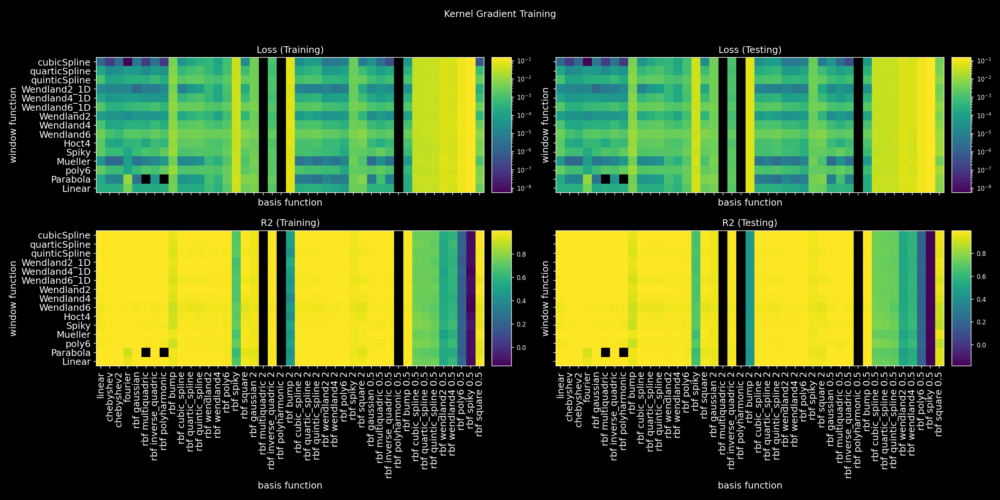

min: 5.482881970656415e-09
max: 0.15051367320367048
min: 5.5868575979714735e-09
max: 0.15289467301907164


In [136]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cbook as cbook
from matplotlib import cm

xvars = windowFunction
yvars = basisFunctions

import matplotlib.patheffects as path_effects
txtLabels = []
def plotToAxis(axis, mat, bounds = None, label = None, log = False):
    if label is not None:
        axis.set_title(label)
    if bounds is None:
        if not log:
            im = axis.imshow(mat, vmin=mat[np.logical_not(np.isnan(mat))].min(), vmax=mat[np.logical_not(np.isnan(mat))].max())
        if log:
            print('min:', mat[np.logical_and(np.logical_not(np.isinf(mat)),np.logical_not(np.isnan(mat)))].min())
            print('max:', mat[np.logical_and(np.logical_not(np.isinf(mat)),np.logical_not(np.isnan(mat)))].max())
            im = axis.imshow(mat, norm = LogNorm(
                vmin=mat[np.logical_and(np.logical_not(np.isinf(mat)),np.logical_not(np.isnan(mat)))].min(), 
                vmax=mat[np.logical_and(np.logical_not(np.isinf(mat)),np.logical_not(np.isnan(mat)))].max()))
    else:
        im = axis.imshow(mat, norm=colors.LogNorm(vmin=bounds[0], vmax=bounds[1]))
    ax1_divider = make_axes_locatable(axis)
    cax1 = ax1_divider.append_axes("right", size="5%", pad="2%")
    cb1 = fig.colorbar(im, cax=cax1,orientation='vertical')
    cb1.ax.tick_params(labelsize=8) 
#         im = axis.imshow(mat, vmin=bounds[0], vmax=bounds[1])
#     for (j,i),label in np.ndenumerate(mat):
#         if not np.isnan(label):
#             st = '%1.2e' % label
#             txtLabels.append(axis.text(i,j,st,ha='center',va='center', color = 'white', fontsize=8, rotation = 0))       
#             txtLabels[-1].set_path_effects([path_effects.Stroke(linewidth=2, foreground='black'), path_effects.Normal()])

    axis.set_yticks(np.arange(len(xvars)))
    axis.set_yticklabels(xvars, minor = False, rotation =0, fontsize = 12)
    axis.set_ylabel('window function', fontsize = 12)
    axis.set_xlabel('basis function' , fontsize = 12)
    axis.set_xticks(np.arange(len(yvars)))
    axis.set_xticklabels(yvars, minor = False, rotation =90, fontsize = 12)
    
    return im
fig, axis = plt.subplots(2, 2, figsize=(18,9), sharex = True, sharey = True, squeeze = False)

plotToAxis(axis[0,0], lossMatA, label = 'Loss (Training)', log = True)
plotToAxis(axis[0,1], lossMatB, label = 'Loss (Testing)', log = True)
plotToAxis(axis[1,0], r2MatA, label = 'R2 (Training)', log = False)
plotToAxis(axis[1,1], r2MatB, label = 'R2 (Testing)', log = False)
fig.suptitle('Kernel Gradient Training')
fig.tight_layout()
axs = []
# for i in range(len(zvars)):
#     subfigs[i,0].suptitle('%s = %s' % (which_z, zvars[i]), fontsize='x-large')
#     lax = subfigs[i,0].subplots(1, 3, sharey=True, squeeze = False)
#     axs.append(lax)    
    
# plot_funcMeta(-1, shareCmap = False)
    
    

In [48]:
# weightDict

In [163]:
def evalChebSeries(n,x):
    cs = []
    for i in range(n):
        if i == 0:
            cs.append(torch.ones_like(x))
        elif i == 1:
            cs.append(x)
        else:
            cs.append(2. * x * cs[i-1] - cs[i-2])
    return torch.stack(cs)
def evalChebSeries2(n,x):
    cs = []
    for i in range(n):
        if i == 0:
            cs.append(torch.ones_like(x))
        elif i == 1:
            cs.append(2 * x)
        else:
            cs.append(2. * x * cs[i-1] - cs[i-2])
    return torch.stack(cs)
sqrt_pi_1 = 1. / np.sqrt(np.pi)

def fourier(n, x):
    if n == 0:
        return torch.ones_like(x) / np.sqrt(2. * np.pi)
    elif n % 2 == 0:
        return torch.cos((n // 2 + 1) * x) * sqrt_pi_1
    return torch.sin((n // 2 + 1) * x) * sqrt_pi_1

def evalFourierSeries(n, x):
    fs = []
    for i in range(n):
        fs.append(fourier(i, x))
    return torch.stack(fs)


In [151]:
chebFn = evalChebSeries(8, x)

<IPython.core.display.Javascript object>


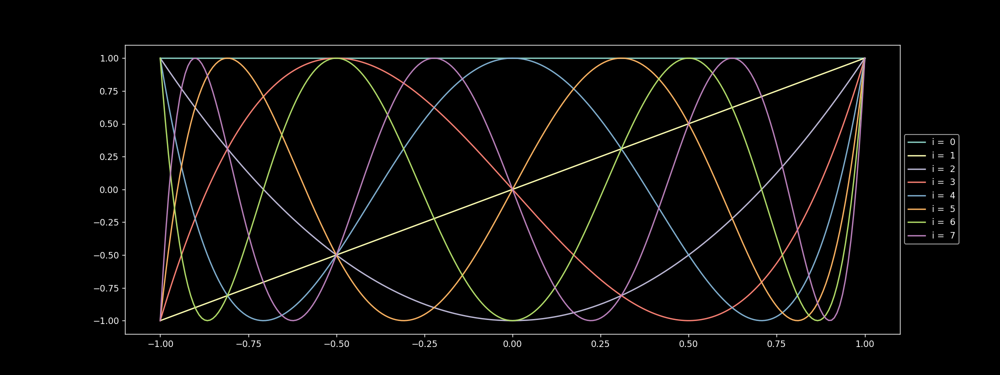

In [155]:
fig, axis = plt.subplots(1, 1, figsize=(16,6), sharex = False, sharey = False, squeeze = False)
for i in range(chebFn.shape[0]):
    axis[0,0].plot(x, chebFn[i,:], label = 'i = %2d' % i)
axis[0,0].legend(loc = 'center left', bbox_to_anchor=(1., 0.50))


  0%|          | 0/4096 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


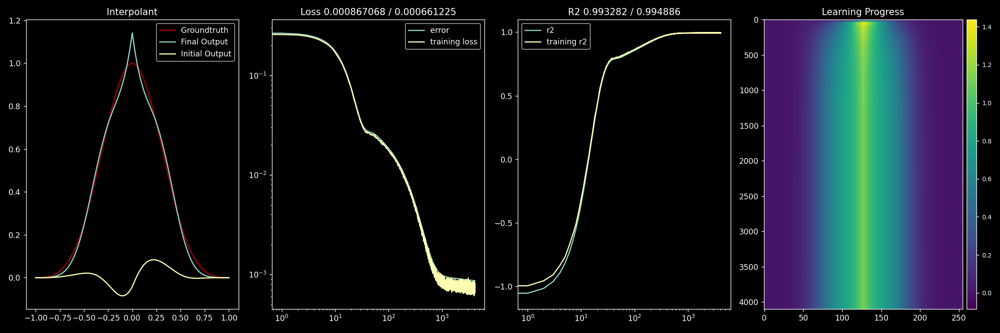

  0%|          | 0/4097 [00:00<?, ?it/s]

In [36]:
import warnings
warnings.filterwarnings("ignore")

n = 8
basis = 'fourier'
# basis = 'rbf cubic_spline 2'
basis = 'rbf cubic_spline 2'
normalizedBasis = False
window = 'poly6'
windowFunctionFn = getWindowFunction(window)
windowFunction = lambda x : windowFunctionFn(torch.abs(x))

# print(dataset[0].shape)
# print(groundTruth[0].shape)
train_dataloader, train_iter = generateLoaders(torch.hstack((dataset,groundTruth)), batch_size = batch_size, shuffleDataset = True, shuffled = False, shuffleSeed = None)

weights = (torch.rand(n) * 2 - 1) * 0.5
weights.requires_grad = True
optimizer = optim.SGD([weights], lr=1e-1, momentum=0.9)

weightList = []
gradList = []
lossList = []
r2List = []
weightList.append(torch.clone(weights.detach()))

for i in tqdm(range(2**12)):
    optimizer.zero_grad()
    
    sampled = sampleDataLoader()
#     print(sampled.shape)
    x = sampled[:,:sampled.shape[1]//2].flatten()
    gt = sampled[:,sampled.shape[1]//2:].flatten()
#     print(x.shape)
    
    fx = evalBasis(n, x, basis, periodic = False, normalized = normalizedBasis) * (windowFunction(x)[None,:] if windowFunction is not None else 1)
    y_pred = torch.sum(weights[:,None] * fx, axis=0)
    loss = torch.mean((y_pred - gt)**2)
    r2List.append(r2_score(gt.detach().cpu().numpy(), y_pred.detach().cpu().numpy()))
    
    loss.backward()
    lossList.append(torch.clone(loss.detach()))

    gradList.append(torch.clone(weights.grad.detach()))
    optimizer.step()
    weightList.append(torch.clone(weights))
    
plotTrainingv4(n, basis, normalizedBasis, target, weightList, gradList, lossList, r2List, plotInterval = 1, windowFn = windowFunction)

  0%|          | 0/16384 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


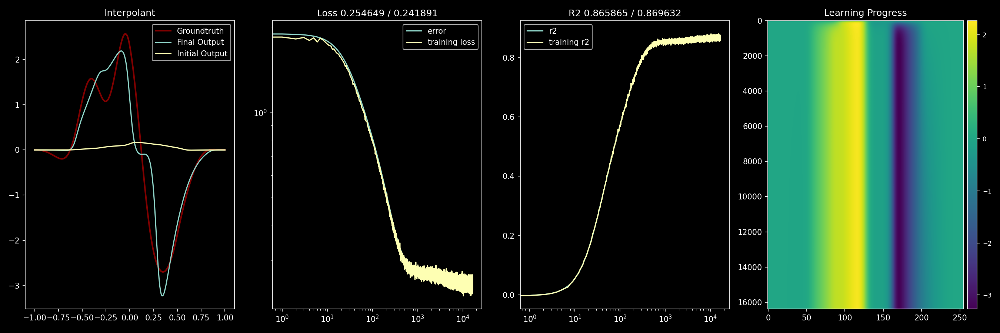

  0%|          | 0/16385 [00:00<?, ?it/s]

In [898]:
import warnings
warnings.filterwarnings("ignore")

n = 8
basis = 'fourier'
basis = 'rbf cubic_spline'
normalizedBasis = True

# print(dataset[0].shape)
# print(groundTruth[0].shape)
train_dataloader, train_iter = generateLoaders(torch.hstack((dataset,groundTruth)), batch_size = batch_size, shuffleDataset = True, shuffled = False, shuffleSeed = None)

weights = (torch.rand(n) * 2 - 1) * 0.2
weights.requires_grad = True
optimizer = optim.SGD([weights], lr=1e-2, momentum=0.9)

weightList = []
gradList = []
lossList = []
r2List = []
weightList.append(torch.clone(weights.detach()))

for i in tqdm(range(2**14)):
    optimizer.zero_grad()
    
    sampled = sampleDataLoader()
#     print(sampled.shape)
    x = sampled[:,:sampled.shape[1]//2].flatten()
    gt = sampled[:,sampled.shape[1]//2:].flatten()
#     print(x.shape)
    
    fx = evalBasis(n, x, basis, periodic = False, normalized = normalizedBasis) * windowFn(x)[None,:]
    y_pred = torch.sum(weights[:,None] * fx, axis=0)
    loss = torch.mean((y_pred - gt)**2)
    r2List.append(r2_score(gt.detach().cpu().numpy(), y_pred.detach().cpu().numpy()))
    
    loss.backward()
    lossList.append(torch.clone(loss.detach()))

    gradList.append(torch.clone(weights.grad.detach()))
    optimizer.step()
    weightList.append(torch.clone(weights))
    
plotTrainingv4(n, basis, normalizedBasis, target, weightList, gradList, lossList, r2List, plotInterval = 1, windowFn = windowFn)

  0%|          | 0/16384 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


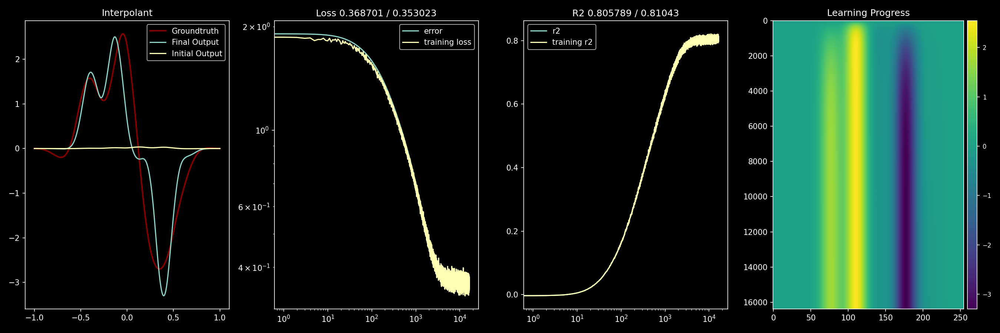

  0%|          | 0/16385 [00:00<?, ?it/s]

In [897]:
import warnings
warnings.filterwarnings("ignore")

n = 8
basis = 'fourier'
basis = 'rbf cubic_spline'
normalizedBasis = False

# print(dataset[0].shape)
# print(groundTruth[0].shape)
train_dataloader, train_iter = generateLoaders(torch.hstack((dataset,groundTruth)), batch_size = batch_size, shuffleDataset = True, shuffled = False, shuffleSeed = None)

weights = (torch.rand(n) * 2 - 1) * 0.2
weights.requires_grad = True
optimizer = optim.SGD([weights], lr=1e-2, momentum=0.9)

weightList = []
gradList = []
lossList = []
r2List = []
weightList.append(torch.clone(weights.detach()))

for i in tqdm(range(2**14)):
    optimizer.zero_grad()
    
    sampled = sampleDataLoader()
#     print(sampled.shape)
    x = sampled[:,:sampled.shape[1]//2].flatten()
    gt = sampled[:,sampled.shape[1]//2:].flatten()
#     print(x.shape)
    
    fx = evalBasis(n, x, basis, periodic = False, normalized = normalizedBasis) * windowFn(x)[None,:]
    y_pred = torch.sum(weights[:,None] * fx, axis=0)
    loss = torch.mean((y_pred - gt)**2)
    r2List.append(r2_score(gt.detach().cpu().numpy(), y_pred.detach().cpu().numpy()))
    
    loss.backward()
    lossList.append(torch.clone(loss.detach()))

    gradList.append(torch.clone(weights.grad.detach()))
    optimizer.step()
    weightList.append(torch.clone(weights))
    
plotTrainingv4(n, basis, normalizedBasis, target, weightList, gradList, lossList, r2List, plotInterval = 1, windowFn = windowFn)

<IPython.core.display.Javascript object>


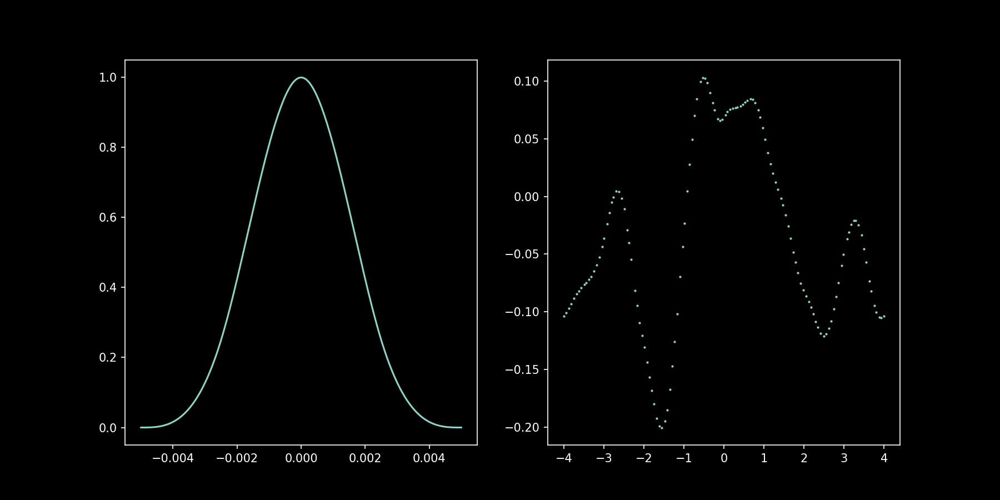

In [282]:
fig, axis = plt.subplots(1, 2, figsize=(12,6), sharex = False, sharey = False, squeeze = False)
    
support = 0.005
windowFunc = getWindowFunction('cubicSpline')
windowFn = lambda x : windowFunc(torch.abs(torch.tensor(x)) / support).numpy()
numSamples = 128
noise  = generate1DPeriodicNoise(numSamples = numSamples, r = 1 / (2 * np.pi), freq = 2, octaves = 4, plot = False, seed = 0x12345, persistence = 0.5)
noiseFn = lambda x : np.interp(x, np.linspace(-1,1,numSamples), noise) 

x = np.linspace(-1 * support,1 * support,256)
fx = windowFn(x)


axis[0,0].plot(x,fx)

sampled = sample(128, 1, method = 'centered', dxScale = 8, clamped = True, seed = None)
scale = 4

sampled = [s * scale for s in sampled]
sampledNoise = [noiseFn(s / scale) for s in sampled]
axis[0,1].scatter(sampled[0], sampledNoise[0], s = 1)

In [ ]:
from typing import Dict, Optional

@torch.jit.script
def broadcast(src: torch.Tensor, other: torch.Tensor, dim: int):
    if dim < 0:
        dim = other.dim() + dim
    if src.dim() == 1:
        for _ in range(0, dim):
            src = src.unsqueeze(0)
    for _ in range(src.dim(), other.dim()):
        src = src.unsqueeze(-1)
    src = src.expand(other.size())
    return src

@torch.jit.script
def scatter_sum(src: torch.Tensor, index: torch.Tensor, dim: int = -1,
                out: Optional[torch.Tensor] = None,
                dim_size: Optional[int] = None) -> torch.Tensor:
    index = broadcast(index, src, dim)
    if out is None:
        size = list(src.size())
        if dim_size is not None:
            size[dim] = dim_size
        elif index.numel() == 0:
            size[dim] = 0
        else:
            size[dim] = int(index.max()) + 1
        out = torch.zeros(size, dtype=src.dtype, device=src.device)
        return out.scatter_add_(dim, index, src)
    else:
        return out.scatter_add_(dim, index, src)


In [ ]:
import scipy.integrate as integrate


Integral of windowFn: 0.3749999948870516


<IPython.core.display.Javascript object>


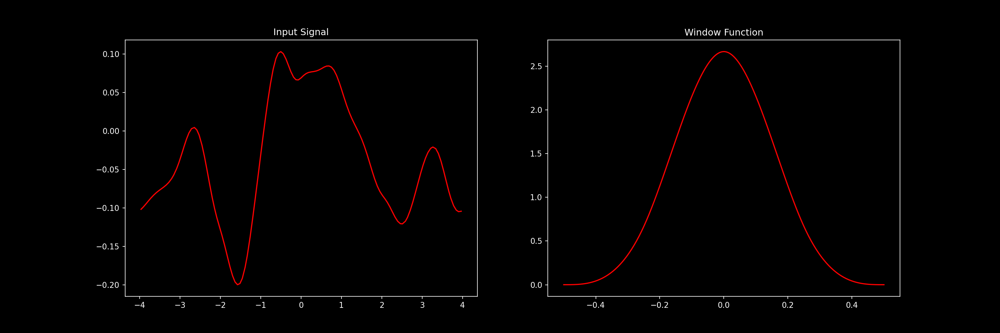

Text(0.5, 1.0, 'Window Function')

In [547]:
support = 0.5

windowFunc = getWindowFunction('cubicSpline')
winFn = lambda x : windowFunc(torch.abs(torch.tensor(x)) / support).numpy()
windowIntegral = integrate.quad(winFn, -support ,support)[0]
print('Integral of windowFn:', windowIntegral)
windowFn = lambda x: winFn(x) / windowIntegral


# windowFn = lambda x : np.sin(x / support * np.pi)
numSamples = 128
noise  = generate1DPeriodicNoise(numSamples = numSamples, r = 1 / (2 * np.pi), freq = 2, octaves = 4, plot = False, seed = 0x12345, persistence = 0.5)
noiseFn = lambda x : np.interp(x, np.linspace(-1,1,numSamples), noise) 

x = np.linspace(-1 * support,1 * support,256)
fx = windowFn(x)

sampled = sample(128, 1, method = 'offCentered', dxScale = 16, clamped = True, seed = None)

scale = 4
# sampled = [np.linspace(-1,1, 2048, endpoint=False)]

sampled = [s * scale for s in sampled]
sampledNoise = [noiseFn(s / scale) for s in sampled]

sTensor = torch.tensor(sampled[0])
fxTensor = torch.tensor(sampledNoise[0])

indices = np.arange(sTensor.shape[0])
indices = np.tile(indices, 3)
indices2 = np.arange(indices.shape[0])

positions = np.hstack((sTensor.numpy() - scale * 2, sTensor.numpy(), sTensor.numpy() + scale * 2))
dij = (positions[:,None] - positions[None,:])
neighbor_j = np.hstack([indices[np.abs(dij[:, sTensor.shape[0] + i]) <= support] for i in range(sTensor.shape[0])])
neighbor_i = np.hstack([np.ones(indices[np.abs(dij[:, sTensor.shape[0] + i]) <= support].shape[0], dtype = np.int64) * i for i in range(sTensor.shape[0])])

neighbors = torch.tensor(np.vstack((neighbor_i, neighbor_j)), dtype = torch.int64)
neighborDistances = torch.tensor(np.hstack([dij[np.abs(dij[:, sTensor.shape[0] + i]) <= support, sTensor.shape[0] + i] for i in range(sTensor.shape[0])]))

i,j = neighbors
funs = windowFn(neighborDistances)

area = scale * 2 / sTensor.shape[0]

fig, axis = plt.subplots(1, 2, figsize=(18,6), sharex = False, sharey = False, squeeze = False)

x = np.linspace(-1 * support,1 * support,256)
fx = windowFn(x)

axis[0,0].plot(sampled[0], sampledNoise[0], 'red')
axis[0,0].set_title('Input Signal')
axis[0,1].plot(x,fx, 'red')
axis[0,1].set_title('Window Function')


Integral of noiseFn: (-3.969012712337686e-17, 4.451700416203983e-15)
Integral of sideband: -0.03050117817680874


<IPython.core.display.Javascript object>


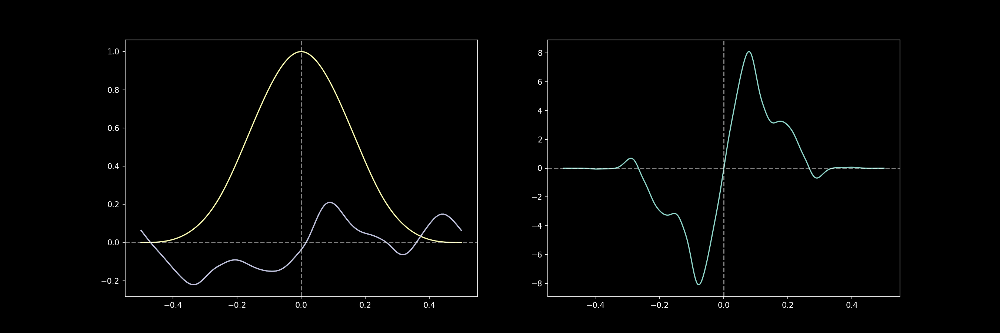

Integral of noiseFn: 2.0398953400273469e-16
Integral of noiseFn: (0.9999999966507429, 6.644581871029231e-05)
Integral of noiseFn: (2.0398953400273469e-16, 2.287975309553073e-14)


In [611]:

symmetricNoise  = generate1DPeriodicNoise(numSamples = numSamples, r = 1 / (2 * np.pi), freq = 2, octaves = 4, plot = False, seed = 0x123456, persistence = 0.5)

symmetricNoiseFn = lambda x : np.interp(x, np.linspace(-support,support,numSamples), symmetricNoise)
symmetricNoiseMinVal = np.min(symmetricNoiseFn(np.linspace(-support,support,numSamples)))
symmetricNoiseMaxVal = np.max(symmetricNoiseFn(np.linspace(-support,support,numSamples)))

symmetricNoiseIntegral = integrate.quad(lambda x: (symmetricNoiseFn(x) - symmetricNoiseMinVal) * winFn(x), -support ,support)[0]
print('Integral of noiseFn:', noiseIntegral)
# windowFn = lambda x : (noiseFn(x) - minVal)* winFn(x) / noiseIntegral + shiftedFn(x)

shiftedFn = lambda x: np.where(x < 0, -symmetricNoiseFn(-(x*2 + support)) + symmetricNoiseFn(support) , symmetricNoiseFn(x*2 - support) - symmetricNoiseFn(support)) * winFn(x)
sidebandIntegral = integrate.quad(lambda x: shiftedFn(x), 0 ,support)[0]
print('Integral of sideband:', sidebandIntegral)
shiftedFn = lambda x: np.where(x < 0, -symmetricNoiseFn(-(x*2 + support)) + symmetricNoiseFn(support) , symmetricNoiseFn(x*2 - support) - symmetricNoiseFn(support)) / sidebandIntegral * winFn(x)
# shiftedFn = lambda x: np.where(x < 0, -noiseFn(-(x)), noiseFn(x))

fig, axis = plt.subplots(1, 2, figsize=(18,6), sharex = False, sharey = False, squeeze = False)

x = np.linspace(-1 * support,1 * support,256)

axis[0,0].plot(x, noiseFn(x))
axis[0,0].plot(x, winFn(x))
axis[0,0].plot(x, np.interp(x, np.linspace(-support,support,numSamples), noise))
axis[0,0].axhline(0, ls= '--', alpha = 0.5)
axis[0,0].axvline(0, ls= '--', alpha = 0.5)
axis[0,1].plot(x, shiftedFn(x))
axis[0,1].axhline(0, ls= '--', alpha = 0.5)
axis[0,1].axvline(0, ls= '--', alpha = 0.5)

noiseIntegral = integrate.quad(lambda x: shiftedFn(x), -support ,support)[0]
print('Integral of noiseFn:', noiseIntegral)
noiseIntegral = integrate.quad(lambda x: shiftedFn(x), 0 ,support)
print('Integral of noiseFn:', noiseIntegral)
noiseIntegral = integrate.quad(lambda x: shiftedFn(x), -support ,support)
print('Integral of noiseFn:', noiseIntegral)
# windowFn = lambda x : (noiseFn(x) - minVal)* winFn(x) / noiseIntegral
# integral = integrate.quad(windowFn, -support ,support)[0]
# print('Integral of windowFn:', integral)

<IPython.core.display.Javascript object>


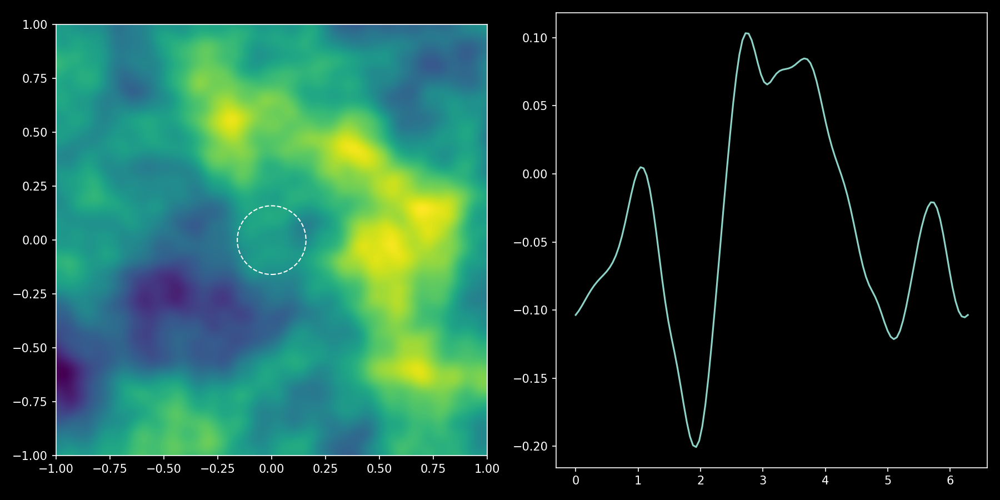

-0.2005099705210106
Integral of noiseFn: 0.08052309230876425
Integral of windowFn: 0.9999999540852521


In [614]:
noise  = generate1DPeriodicNoise(numSamples = numSamples, r = 1 / (2 * np.pi), freq = 2, octaves = 4, plot = False, seed = 0x123456, persistence = 0.5)

noiseFn = lambda x : np.interp(x, np.linspace(-support,support,numSamples), noise) * winFn(x)
minVal = np.min(noiseFn(np.linspace(-support,support,numSamples)))
maxVal = np.max(noiseFn(np.linspace(-support,support,numSamples)))

shiftedFn = lambda x: np.where(x < 0, -noiseFn(-(x*2 + support)), noiseFn(x*2 - support))


noise  = generate1DPeriodicNoise(numSamples = numSamples, r = 1 / (2 * np.pi), freq = 2, octaves = 4, plot = True, seed = 0x12345, persistence = 0.5)
noiseFn = lambda x : np.interp(x, np.linspace(-support,support,numSamples), noise) 
minVal = np.min(noiseFn(np.linspace(-support,support,numSamples)))
maxVal = np.max(noiseFn(np.linspace(-support,support,numSamples)))
# minVal = 0
print(minVal)

noiseIntegral = integrate.quad(lambda x: (noiseFn(x) - minVal) * winFn(x), -support ,support)[0]
print('Integral of noiseFn:', noiseIntegral)
windowFn = lambda x : (noiseFn(x) - minVal)* winFn(x) / noiseIntegral
# windowFn = lambda x : (noiseFn(x) - minVal)* winFn(x) / noiseIntegral + shiftedFn(x)
integral = integrate.quad(windowFn, -support ,support)[0]
print('Integral of windowFn:', integral)

# noiseIntegral = integrate.quad(lambda x: (noiseFn(x) - minVal), -support ,support)[0]
# print('Integral of noiseFn:', noiseIntegral)
# windowFn = lambda x : (noiseFn(x) - minVal) / noiseIntegral
# integral = integrate.quad(windowFn, -support ,support)[0]
# print('Integral of windowFn:', integral)

Integral of initialFn: -0.28902617987394047
Integral of finalFn: -0.316720978284558


<IPython.core.display.Javascript object>


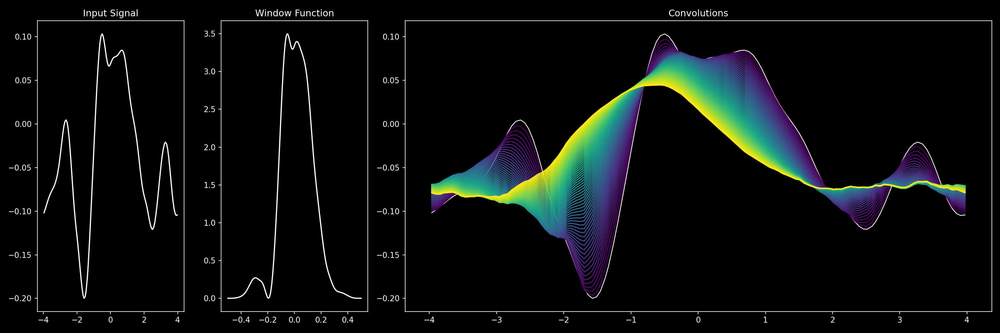

In [615]:

ans = torch.clone(fxTensor)
convs = []
iterations =  64
funs = windowFn(neighborDistances)

for it in range(iterations):
#     print(i)
#     print(ans.shape, ans)
    ansc = torch.clone(scatter_sum(ans[j] * funs * area, i))
#     print(ans.shape)
#     print('ansc', ansc)
    convs.append(ansc)
    ans = ansc
    
initialFn = lambda x: np.interp(x, np.linspace(-scale,scale, fxTensor.shape[0]), fxTensor.numpy()) 
finalFn = lambda x: np.interp(x, np.linspace(-scale,scale, fxTensor.shape[0]), convs[-1].numpy()) 

integral = integrate.quad(initialFn, -scale ,scale)[0]
print('Integral of initialFn:', integral)
integral = integrate.quad(finalFn, -scale ,scale)[0]
print('Integral of finalFn:', integral)

fig, axis = plt.subplots(1, 3, figsize=(18,6),gridspec_kw={'width_ratios': [1,1,4]}, sharex = False, sharey = False, squeeze = False)

x = np.linspace(-1 * support,1 * support,256)
fx = windowFn(x)

axis[0,0].plot(sampled[0], sampledNoise[0], 'white')
axis[0,0].set_title('Input Signal')
axis[0,1].plot(x,fx, 'white')
axis[0,1].set_title('Window Function')

axis[0,2].plot(sampled[0], sampledNoise[0], lw = 1, c = 'white')
axis[0,2].set_title('Convolutions')
for it in range(iterations):
    c = cmap(1 / (len(convs) - 1)* it)
    axis[0,2].plot(sampled[0], convs[it], c = c)
    
    fig.tight_layout()

Integral of initialFn: -0.28902617987394047
Integral of finalFn: -0.20411234080095061


<IPython.core.display.Javascript object>


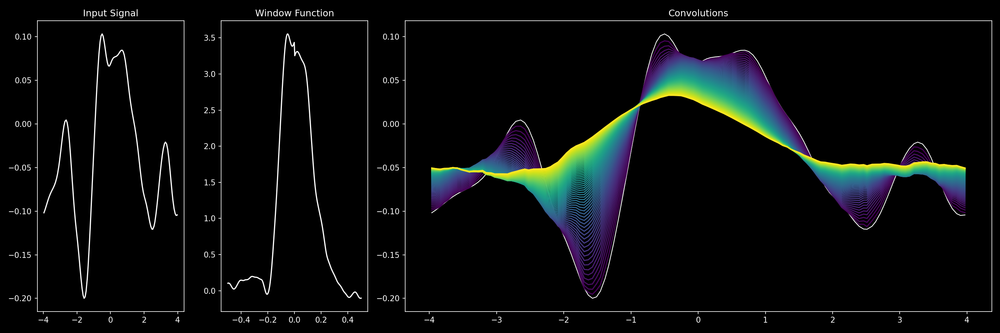

In [613]:

ans = torch.clone(fxTensor)
convs = []
iterations =  64
funs = windowFn(neighborDistances)

for it in range(iterations):
#     print(i)
#     print(ans.shape, ans)
    ansc = torch.clone(scatter_sum(ans[j] * funs * area, i))
#     print(ans.shape)
#     print('ansc', ansc)
    convs.append(ansc)
    ans = ansc
    
initialFn = lambda x: np.interp(x, np.linspace(-scale,scale, fxTensor.shape[0]), fxTensor.numpy()) 
finalFn = lambda x: np.interp(x, np.linspace(-scale,scale, fxTensor.shape[0]), convs[-1].numpy()) 

integral = integrate.quad(initialFn, -scale ,scale)[0]
print('Integral of initialFn:', integral)
integral = integrate.quad(finalFn, -scale ,scale)[0]
print('Integral of finalFn:', integral)

fig, axis = plt.subplots(1, 3, figsize=(18,6),gridspec_kw={'width_ratios': [1,1,4]}, sharex = False, sharey = False, squeeze = False)

x = np.linspace(-1 * support,1 * support,256)
fx = windowFn(x)

axis[0,0].plot(sampled[0], sampledNoise[0], 'white')
axis[0,0].set_title('Input Signal')
axis[0,1].plot(x,fx, 'white')
axis[0,1].set_title('Window Function')

axis[0,2].plot(sampled[0], sampledNoise[0], lw = 1, c = 'white')
axis[0,2].set_title('Convolutions')
for it in range(iterations):
    c = cmap(1 / (len(convs) - 1)* it)
    axis[0,2].plot(sampled[0], convs[it], c = c)
    
    fig.tight_layout()

Integral of initialFn: -0.2881391342737864
Integral of finalFn: -0.2982244146827013


<IPython.core.display.Javascript object>


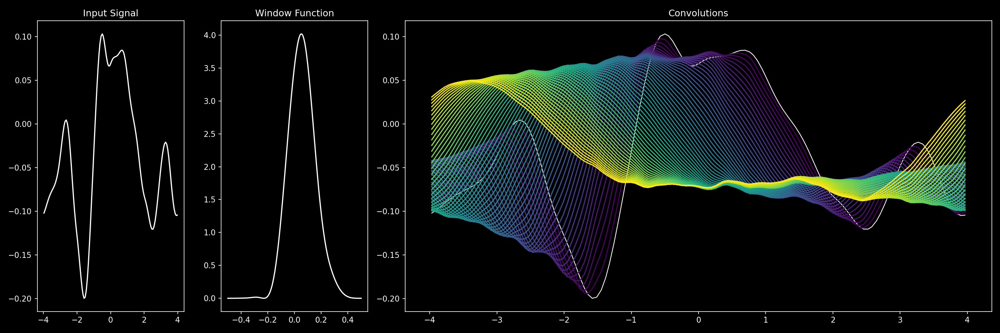

In [540]:

ans = torch.clone(fxTensor)
convs = []
iterations =  64
funs = windowFn(neighborDistances)

for it in range(iterations):
#     print(i)
#     print(ans.shape, ans)
    ansc = torch.clone(scatter_sum(ans[j] * funs * area, i))
#     print(ans.shape)
#     print('ansc', ansc)
    convs.append(ansc)
    ans = ansc
    
initialFn = lambda x: np.interp(x, np.linspace(-scale,scale, fxTensor.shape[0]), fxTensor.numpy()) 
finalFn = lambda x: np.interp(x, np.linspace(-scale,scale, fxTensor.shape[0]), convs[-1].numpy()) 

integral = integrate.quad(initialFn, -scale ,scale)[0]
print('Integral of initialFn:', integral)
integral = integrate.quad(finalFn, -scale ,scale)[0]
print('Integral of finalFn:', integral)

fig, axis = plt.subplots(1, 3, figsize=(18,6),gridspec_kw={'width_ratios': [1,1,4]}, sharex = False, sharey = False, squeeze = False)

x = np.linspace(-1 * support,1 * support,256)
fx = windowFn(x)

axis[0,0].plot(sampled[0], sampledNoise[0], 'white')
axis[0,0].set_title('Input Signal')
axis[0,1].plot(x,fx, 'white')
axis[0,1].set_title('Window Function')

axis[0,2].plot(sampled[0], sampledNoise[0], lw = 1, c = 'white')
axis[0,2].set_title('Convolutions')
for it in range(iterations):
    c = cmap(1 / (len(convs) - 1)* it)
    axis[0,2].plot(sampled[0], convs[it], c = c)
    
    fig.tight_layout()